In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import axes
from PIL import Image

In [3]:
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import matplotlib.pyplot as plt
import argparse

In [4]:
pwd

'C:\\UNI\\Labo\\Liiarpi_1-master'

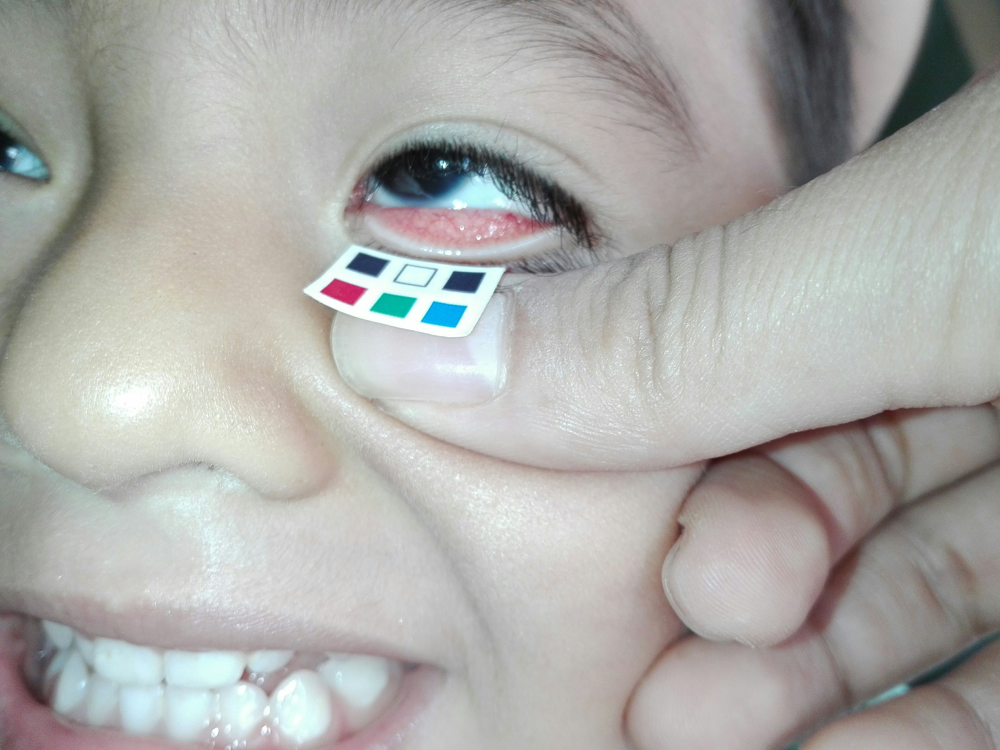

In [27]:
img = io.imread('C://UNI//Labo//Liiarpi_1-master/c1anemia-166.jpg')
img2=img.copy()
img2s=Image.fromarray(img2)
img2s

In [28]:
eye_cascade=cv2.CascadeClassifier('haarcascade_eye.xml')

In [29]:
print(img.shape)

(3120, 4160, 3)


In [30]:
factor = 0.05
def returnfactor(img, factor):
    a = int(img.shape[1]*factor)
    b = int(img.shape[0]*factor)
    return cv2.resize(img, (a, b))

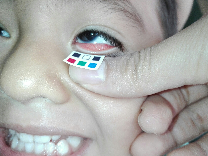

In [31]:
imgsc = returnfactor(img, factor)
img2s=Image.fromarray(imgsc)
img2s

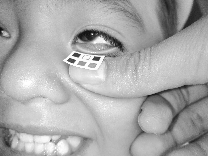

In [32]:
gray = cv2.cvtColor(imgsc, cv2.COLOR_BGR2GRAY)
img2s=Image.fromarray(gray)
img2s

In [33]:
eyes = eye_cascade.detectMultiScale(gray)
eyes

array([[54,  8, 76, 76]], dtype=int32)

In [34]:
a = []
ma = -100
fl = -1
b = []
print(eyes)

[[54  8 76 76]]


In [35]:
if eyes.shape[0]>1 :
    for i, (x,y,w,h) in enumerate(eyes) :
        if w*h > ma:
            ma = max(ma, w*h)
            fl = i
            b = [x,y,w,h]
else:
    fl = 0
    b = eyes[0]
print(fl, b)

0 [54  8 76 76]


In [36]:
for (x,y,w,h) in eyes :

    print(x,y,w,h)
    a.append([int(x/factor),int(y/factor),int(w/factor),int(h/factor)])
    cv2.rectangle(imgsc,(x,y),(x+w,y+h),(255,0,0),0)
print(len(eyes))
print(a)

54 8 76 76
1
[[1080, 160, 1520, 1520]]


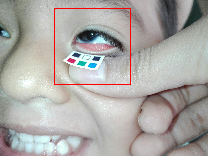

In [37]:
img2s=Image.fromarray(imgsc)
img2s

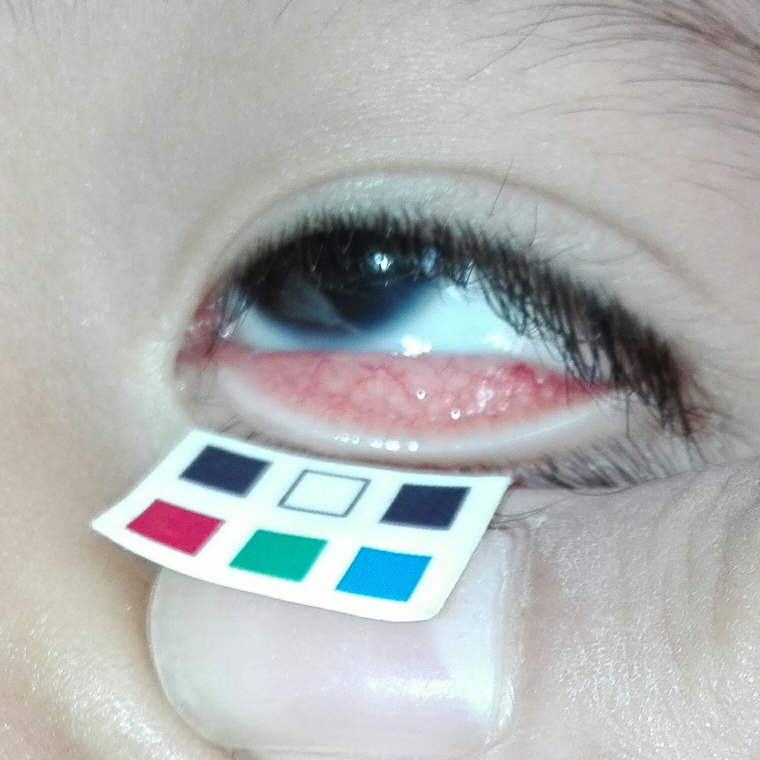

In [38]:
fimg = img[int(b[1]/factor):int(b[1]/factor)+ int(b[3]/factor),int(b[0]/factor):int(b[0]/factor)+ int(b[2]/factor),:]
img2s=Image.fromarray(returnfactor(fimg, 0.5))
img2s

In [39]:
segments = slic(fimg, n_segments = 500, sigma = 5)

C:\Users\abdig\miniconda3\envs\sale\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  """Entry point for launching an IPython kernel.


In [40]:
segments

array([[  0,   0,   0, ...,  21,  21,  21],
       [  0,   0,   0, ...,  21,  21,  21],
       [  0,   0,   0, ...,  21,  21,  21],
       ...,
       [451, 451, 451, ..., 449, 449, 449],
       [451, 451, 451, ..., 449, 449, 449],
       [451, 451, 451, ..., 449, 449, 449]], dtype=int64)

In [41]:
fimg.shape

(1520, 1520, 3)

(-0.5, 1519.5, 1519.5, -0.5)

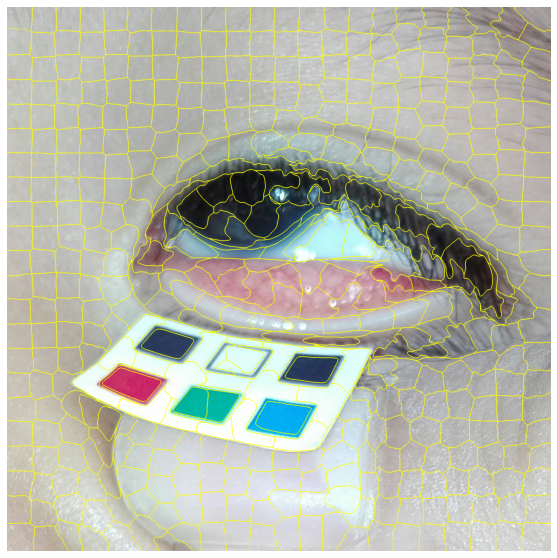

In [42]:
fig = plt.figure("Superpixels -- %d segments" % (500),figsize=(10,10))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(mark_boundaries(fimg, segments))
plt.axis("off")

In [43]:
def imadjust(img, In=(0.0,255.0), Out=(0,255.0), gamma=1.0):
    "J = low_out +(high_out - low_out).* ((I - low_in)/(high_in - low_in)).^ gamma"
    low_in,high_in = In
    low_out, high_out = Out
 
   
    k = (high_out - low_out) / (high_in - low_in)
         # Gamma transformation table
    table = np.array([((i / 255.0) ** gamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    h,w = img.shape[:2]
    imgOut = np.zeros((h,w), np.uint8)
    
    for r in range(h):
        for c in range(w):
            if img[r,c] <= low_in:
                imgOut[r,c] = low_out                
            elif img[r,c] > high_in:
                imgOut[r,c] = high_out
            else:
                res = int(k*(img[r,c]-low_in) + low_out)
                imgOut[r,c] = table[res]#Check table
               
    return imgOut

MAX y min 101 189
Intensidad  (304, 304)
Media 77.15813279085873
========Contours=========
270
(1520, 1520, 3)
(1520, 1520, 3)


(-0.5, 1519.5, 1519.5, -0.5)

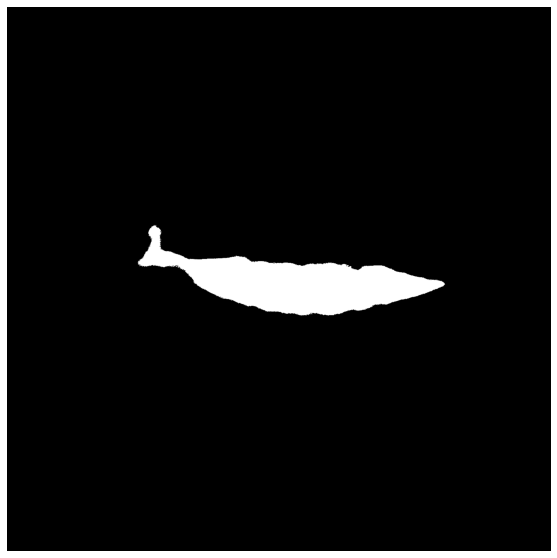

In [44]:

rrc = np.array(fimg)
brown_lo=np.array([200,200,140])
brown_hi=np.array([255,255,255])
'''
cv2.imshow('fimg', returnfactor(fimg, 0.2))

k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()
'''
##==================Suavizador
blur = cv2.GaussianBlur(fimg,(33,33),0)
#blur = cv2.medianBlur(blur,15)
'''
cv2.imshow('blur', returnfactor(blur, 0.2))
print(np.max(blur))
k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()
'''
#print(blur)
simg = cv2.cvtColor(blur, cv2.COLOR_BGR2LAB)[:,:,1]
arrb = np.asarray(simg)
simg=imadjust(simg,(arrb.min(),arrb.max()),(0,255))
print("MAX y min", arrb.min(), arrb.max(), sep=" ")
aux = returnfactor(simg, 0.2)
print("Intensidad ",aux.shape)
'''
cv2.imshow('image_out', aux)

k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()
    
'''
'''otsu = np.zeros(blur.shape)
otsu[blur>=128]=0
otsu[blur<128]=1
cv2.imshow('otsu', returnfactor(otsu, 0.2))
k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()
'''

#===========Threshold===============
raux = np.asarray(aux).reshape(-1,1)
print("Media", np.mean(raux))
n_tr = int(np.mean(raux)+1.5*np.std(raux))
ret, thresh = cv2.threshold(simg, n_tr, 255, 0)
'''
cv2.imshow('otsu', returnfactor(thresh, 0.2))
k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()
    '''
_, contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print("========Contours=========")
print(len(contours))
def hola(ccc):
    aa = thresh.shape[0]/2
    M = cv2.moments(ccc)
    cy = int(M['m01']/(M['m00']))
    cx = int(M['m10']/(M['m00']))
    return np.sqrt((cx-aa)**2+(cy-aa)**2)
con2 = sorted(contours, key=cv2.contourArea)
rcon3 = con2[-2:]
con3 = sorted(rcon3, key = hola)
ccon = con3[0]

fimg = cv2.drawContours(fimg, contours, -1, (0, 255, 0), 8)
'''
cv2.imshow('edges', returnfactor(fimg, 0.2))
k = cv2.waitKey(0)
if k == 27:         # wait for ESC key to exit
    cv2.destroyAllWindows()
'''
mask = np.zeros_like(fimg)
out = np.zeros_like(fimg)
print(mask.shape, out.shape, sep='\n')
mask = cv2.fillPoly(mask, pts =[ccon], color=(255,255,255))
out[mask == 255] = rrc[mask == 255]
fig = plt.figure("Superpixels -- %d segments" % (500),figsize=(10,10))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(mask)
plt.axis("off")


(-0.5, 1519.5, 1519.5, -0.5)

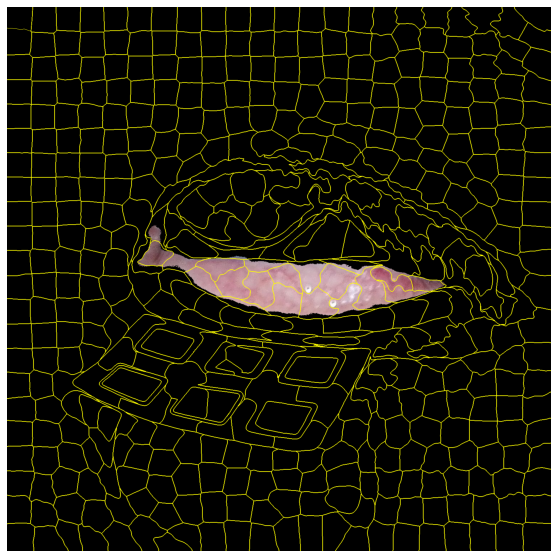

In [45]:
fig = plt.figure("Superpixels -- %d segments" % (500),figsize=(10,10))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(mark_boundaries(out, segments))
plt.axis("off")

In [46]:
b = {1:4, 5:7}
list(b.keys())
b.update({41:8})
b
for i in b:
    print(i)

1
5
41


In [47]:
nseg =np.array(segments).reshape(out.shape[0], out.shape[1])
nseg

array([[  0,   0,   0, ...,  21,  21,  21],
       [  0,   0,   0, ...,  21,  21,  21],
       [  0,   0,   0, ...,  21,  21,  21],
       ...,
       [451, 451, 451, ..., 449, 449, 449],
       [451, 451, 451, ..., 449, 449, 449],
       [451, 451, 451, ..., 449, 449, 449]], dtype=int64)

18


(-0.5, 1519.5, 1519.5, -0.5)

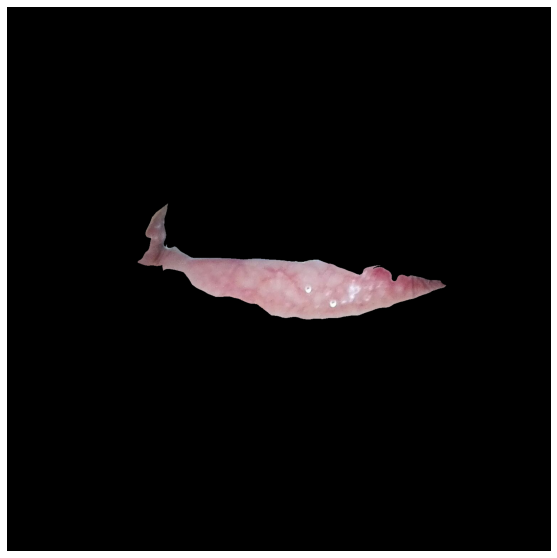

In [48]:
cout = np.zeros(out.shape)
ss = {}
for i in range(out.shape[0]):
    for j in range(out.shape[1]):
        if mask[i, j][0] == 255:
            if not nseg[i, j] in list(ss.keys()):
                ss.update({nseg[i,j]: 0})
            else:
                ss[nseg[i,j]] += 1
aa = []
for i in ss:
    if ss[i] >1150:
        aa.append(i)
for i in range(out.shape[0]):
    for j in range(out.shape[1]):
        if nseg[i,j] in aa:
            cout[i,j,:]=(rrc[i, j, 0], rrc[i,j, 1], rrc[i,j,2])
print(len(aa))
fig = plt.figure("Superpixels -- %d segments" % (500),figsize=(10,10))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(cout.astype('uint8'))
plt.axis("off")      

In [49]:
cout.shape

(1520, 1520, 3)

In [50]:
RID=set(segments.flatten())

In [51]:
f=np.zeros((fimg.shape[0],fimg.shape[1],4))
f.shape

(1520, 1520, 4)

In [52]:
f[:,:,0:3]=fimg[:,:,0:3]
f[:,:,3]=segments
f.shape

(1520, 1520, 4)

In [150]:
DIRID={i:{'N':0,'RGB':np.zeros((3))} for i in RID}
for i in f:
    for j in i:
        DIRID[j[3]]['RGB']+=j[0:3]
        DIRID[j[3]]['N']+=1
DIRID

{0: {'N': 4075, 'RGB': array([658859., 582798., 504050.])},
 1: {'N': 3771, 'RGB': array([617911., 547364., 473043.])},
 2: {'N': 3659, 'RGB': array([615717., 552621., 493579.])},
 3: {'N': 3786, 'RGB': array([645611., 595388., 537139.])},
 4: {'N': 4097, 'RGB': array([706479., 654049., 597563.])},
 5: {'N': 4432, 'RGB': array([799582., 769766., 713072.])},
 6: {'N': 3995, 'RGB': array([722234., 692713., 642106.])},
 7: {'N': 4183, 'RGB': array([763225., 731018., 668179.])},
 8: {'N': 4051, 'RGB': array([729348., 692380., 632279.])},
 9: {'N': 3928, 'RGB': array([701953., 662644., 605849.])},
 10: {'N': 4025, 'RGB': array([718760., 677317., 617413.])},
 11: {'N': 3596, 'RGB': array([643194., 611005., 556711.])},
 12: {'N': 4170, 'RGB': array([725222., 669603., 601585.])},
 13: {'N': 3824, 'RGB': array([652414., 592181., 525343.])},
 14: {'N': 4038, 'RGB': array([673150., 606024., 526389.])},
 15: {'N': 4185, 'RGB': array([677648., 606893., 500735.])},
 16: {'N': 4281, 'RGB': array([677

In [151]:
for i in DIRID:
    DIRID[i]['RGB']//=DIRID[i]['N']
DIRID

{0: {'N': 4075, 'RGB': array([161., 143., 123.])},
 1: {'N': 3771, 'RGB': array([163., 145., 125.])},
 2: {'N': 3659, 'RGB': array([168., 151., 134.])},
 3: {'N': 3786, 'RGB': array([170., 157., 141.])},
 4: {'N': 4097, 'RGB': array([172., 159., 145.])},
 5: {'N': 4432, 'RGB': array([180., 173., 160.])},
 6: {'N': 3995, 'RGB': array([180., 173., 160.])},
 7: {'N': 4183, 'RGB': array([182., 174., 159.])},
 8: {'N': 4051, 'RGB': array([180., 170., 156.])},
 9: {'N': 3928, 'RGB': array([178., 168., 154.])},
 10: {'N': 4025, 'RGB': array([178., 168., 153.])},
 11: {'N': 3596, 'RGB': array([178., 169., 154.])},
 12: {'N': 4170, 'RGB': array([173., 160., 144.])},
 13: {'N': 3824, 'RGB': array([170., 154., 137.])},
 14: {'N': 4038, 'RGB': array([166., 150., 130.])},
 15: {'N': 4185, 'RGB': array([161., 145., 119.])},
 16: {'N': 4281, 'RGB': array([158., 137., 111.])},
 17: {'N': 3477, 'RGB': array([155., 129., 104.])},
 18: {'N': 4186, 'RGB': array([149., 124.,  97.])},
 19: {'N': 4196, 'RGB'

In [152]:
ff=f.copy()

In [153]:
for i in ff:
    for j in i:
        j[0:3]=DIRID[j[3]]['RGB']
t=np.zeros((fimg.shape[0],fimg.shape[1],3))
t=ff[:,:,0:3]
ff=t

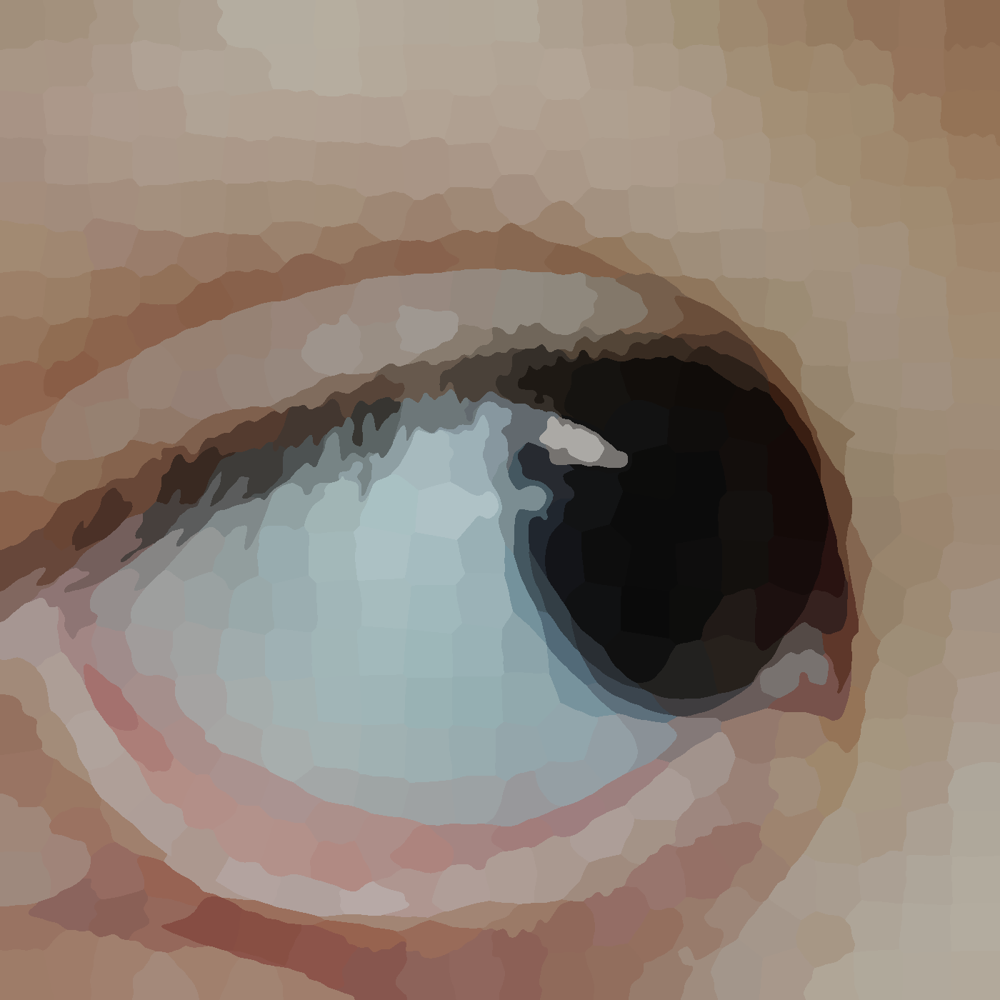

In [155]:
img2s=Image.fromarray(ff.astype(np.uint8))
img2s

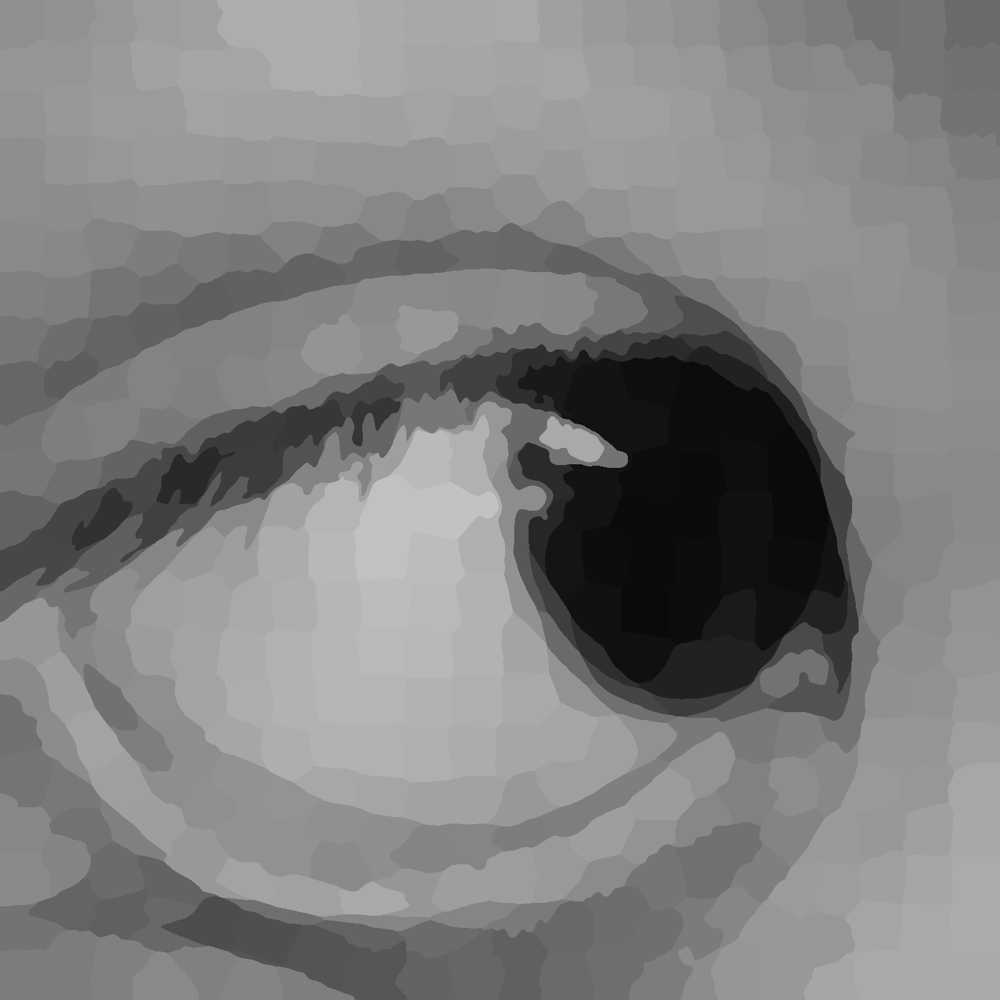

In [156]:
img2s=Image.fromarray(ff[:,:,1].astype(np.uint8))
img2s

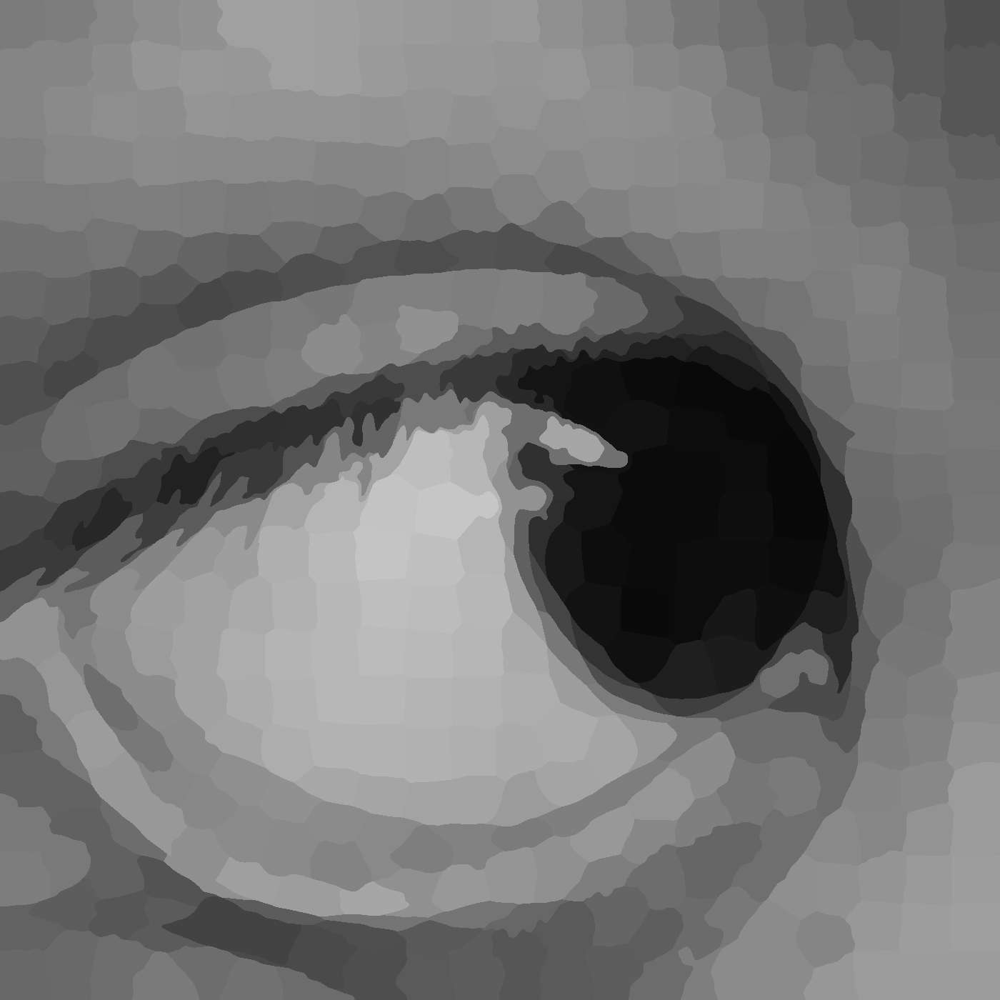

In [157]:
img2s=Image.fromarray(ff[:,:,2].astype(np.uint8))
img2s